# ResNext + Unet++

1) load a data for a test
2) update a loop for test
3) for each epoch display a training loss , validation loss and test loss + ssim value also

# Data Loading

## Train

In [1]:
X_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy'
y_train_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy'

## Test

In [2]:
X_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-test-data/2024-06-10_0d6402b1/seismic_w_noise_vol_44319345.npy'
y_test_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487919/seismicCubes_RFC_fullstack_2024.42487919.npy'

## Valid

In [3]:
X_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismic_w_noise_vol_42502775.npy'
y_valid_path = '/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42502775/seismicCubes_RFC_fullstack_2024.42502775.npy'

In [4]:
shape = (1259,300,300)
# load the data
# make the data in 2d section
# make the train set and test set
# print the image also

In [5]:
import os
import pandas as pd
import numpy as np
from torchvision.io import read_image
from torch.utils.data import Dataset,DataLoader
import torch
# 2 files
# 1259*300*300 ---> 1259*300 in 300 images
# x,y load
# x,y sub sample
# pair
# return
class volDataset(Dataset):
    def __init__(self, x_slices, y_slices, transform=None):
        """
        x_slices: List of noisy seismic slices (each of shape 1259x300)
        y_slices: List of clean seismic slices (each of shape 1259x300)
        """
        self.x_slices = x_slices
        self.y_slices = y_slices
        self.transform = transform

    def __len__(self):
        return len(self.x_slices)

    def __getitem__(self, idx):
        """Returns one slice (1, 1259, 300)"""
        x_slice = torch.tensor(self.x_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)
        y_slice = torch.tensor(self.y_slices[idx], dtype=torch.float32).unsqueeze(0)  # (1, 1259, 300)

        if self.transform:
            x_slice = self.transform(x_slice)
            y_slice = self.transform(y_slice)

        return x_slice, y_slice

In [6]:
from sklearn.model_selection import train_test_split
# Convert volume to 2D slices
# Load seismic volumes
X_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismic_w_noise_vol_42487393.npy',allow_pickle=True)  # (1259, 300, 300)
y_volume = np.load('/home/simlab120/Denoise_comp/Pragyant/image-impeccable-train-data-part1/42487393/seismicCubes_RFC_fullstack_2024.42487393.npy',allow_pickle=True)  # (1259, 300, 300)

X_volume_t = np.load(X_test_path,allow_pickle=True)
y_volume_t = np.load(y_test_path,allow_pickle=True)

X_volume_v = np.load(X_valid_path,allow_pickle=True)
y_volume_v = np.load(y_valid_path,allow_pickle=True)
# Convert volume to 2D slices

X_slices = [X_volume[:, :, i] for i in range(X_volume.shape[2])]  # List of 300 slices
y_slices = [y_volume[:, :, i] for i in range(y_volume.shape[2])]  # List of 300 slices

X_slices_t = [X_volume_t[:, :, i] for i in range(X_volume_t.shape[2])]
y_slices_t = [y_volume_t[:, :, i] for i in range(y_volume_t.shape[2])]

X_slices_v = [X_volume_v[:, :, i] for i in range(X_volume_v.shape[2])]
y_slices_v = [y_volume_v[:, :, i] for i in range(y_volume_v.shape[2])]

# Create datasets
train_dataset = volDataset(X_slices, y_slices)
valid_dataset = volDataset(X_slices_v,y_slices_v)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(valid_dataset,batch_size=8, shuffle=False)

# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break
for x_batch, y_batch in val_loader:
    print("valid Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (8, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])
valid Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


# Model

In [7]:
import os
import torch
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms

In [8]:
class Crop2d(nn.Module):
    def __init__(self, left=10, right=10, top=21, bottom=0):
        super(Crop2d, self).__init__()
        self.left = left
        self.right = right
        self.top = top
        self.bottom = bottom

    def forward(self, x):
        return x[:, :, self.top:x.shape[2] - self.bottom, self.left:x.shape[3] - self.right]

In [9]:
pip install timm

Note: you may need to restart the kernel to use updated packages.


In [10]:
pip install segmentation_models_pytorch

Note: you may need to restart the kernel to use updated packages.


In [11]:
import timm
from segmentation_models_pytorch.decoders.unetplusplus import UnetPlusPlus

/home/simlab120/anaconda3/envs/torch/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [12]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import resnext101_64x4d, ResNeXt101_64X4D_Weights

# ------------------------
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, 3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.block(x)

# ------------------------
class Decoder(nn.Module):
    def __init__(self):
        super().__init__()
        self.up4 = ConvBlock(2048 + 1024, 1024)
        self.up3 = ConvBlock(1024 + 512, 512)
        self.up2 = ConvBlock(512 + 256, 256)
        self.up1 = ConvBlock(256 + 64, 64)
        self.final = nn.Conv2d(64, 1, kernel_size=1)

    def forward(self, c1, c2, c3, c4, c5):
        u4 = F.interpolate(c5, size=c4.shape[2:], mode='bilinear', align_corners=False)
        u4 = self.up4(torch.cat([u4, c4], dim=1))

        u3 = F.interpolate(u4, size=c3.shape[2:], mode='bilinear', align_corners=False)
        u3 = self.up3(torch.cat([u3, c3], dim=1))

        u2 = F.interpolate(u3, size=c2.shape[2:], mode='bilinear', align_corners=False)
        u2 = self.up2(torch.cat([u2, c2], dim=1))

        u1 = F.interpolate(u2, size=c1.shape[2:], mode='bilinear', align_corners=False)
        u1 = self.up1(torch.cat([u1, c1], dim=1))

        out = self.final(u1)
        return out

# ------------------------
class ResNeXt_UNetPP(nn.Module):
    def __init__(self):
        super().__init__()
        weights = ResNeXt101_64X4D_Weights.IMAGENET1K_V1
        backbone = resnext101_64x4d(weights=weights)

        # Change input channel to 1 if needed
        backbone.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

        # Encoder stages
        self.layer0 = nn.Sequential(backbone.conv1, backbone.bn1, backbone.relu, backbone.maxpool)  # c1
        self.layer1 = backbone.layer1  # c2
        self.layer2 = backbone.layer2  # c3
        self.layer3 = backbone.layer3  # c4
        self.layer4 = backbone.layer4  # c5

        # Decoder
        self.decoder = Decoder()

    def forward(self, x):
        c1 = self.layer0(x)   # lowest-level feature
        c2 = self.layer1(c1)
        c3 = self.layer2(c2)
        c4 = self.layer3(c3)
        c5 = self.layer4(c4)

        out = self.decoder(c1, c2, c3, c4, c5)

        out = F.interpolate(out, size=x.shape[2:], mode='bilinear', align_corners=False)
        return out

# ------------------------
if __name__ == "__main__":
    model = ResNeXt_UNetPP()
    x = torch.randn(1, 1, 1259, 300)
    y = model(x)
    print(y.shape)  # [1, 1, 1259, 300]

torch.Size([1, 1, 1259, 300])


In [13]:
pip install torcheval

Note: you may need to restart the kernel to use updated packages.


In [15]:
import torch
import torch.nn as nn
import torch.optim as optim

# Define model
model = ResNeXt_UNetPP()

# Define Loss Function (MSE for denoising)
criterion = nn.MSELoss()

# Define Optimizer (Adam works well)
optimizer = optim.Adam(model.parameters(), lr=0.1)

In [16]:
# Check batch shapes
for x_batch, y_batch in train_loader:
    print("Train Batch Shape:", x_batch.shape, y_batch.shape)  # Expected: (batch_size, 1, 1259, 300)
    break

Train Batch Shape: torch.Size([8, 1, 1259, 300]) torch.Size([8, 1, 1259, 300])


In [17]:
from torchmetrics import StructuralSimilarityIndexMeasure
ssim_metric = StructuralSimilarityIndexMeasure()

/home/simlab120/anaconda3/envs/torch/lib/python3.12/site-packages/torchmetrics/utilities/prints.py:62: FutureWarning: Importing `StructuralSimilarityIndexMeasure` from `torchmetrics` was deprecated and will be removed in 2.0. Import `StructuralSimilarityIndexMeasure` from `torchmetrics.image` instead.
  _future_warning(


In [18]:
import matplotlib.pyplot as plt

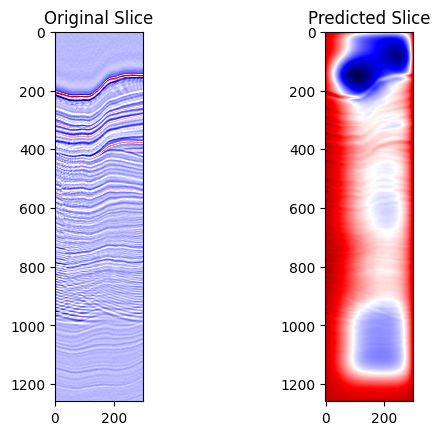

Epoch [1/200], Train Loss: 4514.3858, Train SSIM: 0.6654,           Val Loss: 2167325.2961, Val SSIM: 0.0661


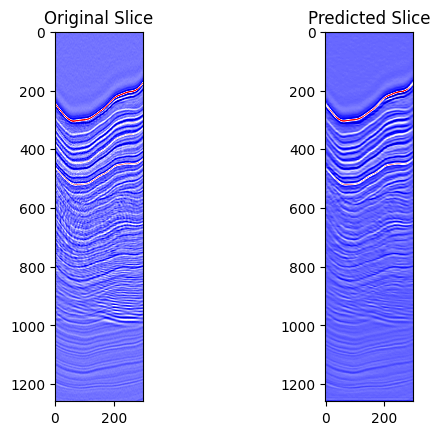

Epoch [2/200], Train Loss: 1749.4444, Train SSIM: 0.8155,           Val Loss: 3125.4185, Val SSIM: 0.4219


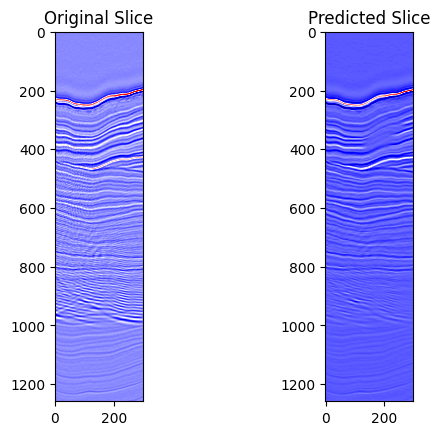

Epoch [3/200], Train Loss: 1531.4539, Train SSIM: 0.8415,           Val Loss: 1430.2065, Val SSIM: 0.7115


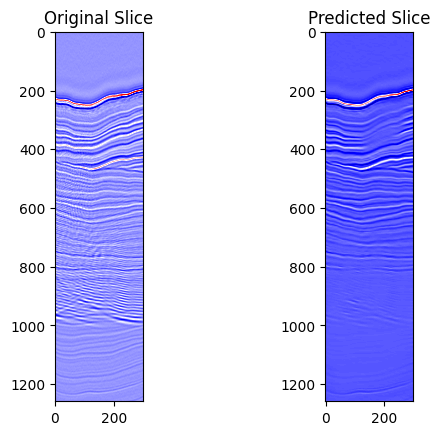

Epoch [4/200], Train Loss: 1455.2796, Train SSIM: 0.8535,           Val Loss: 1525.5568, Val SSIM: 0.7912


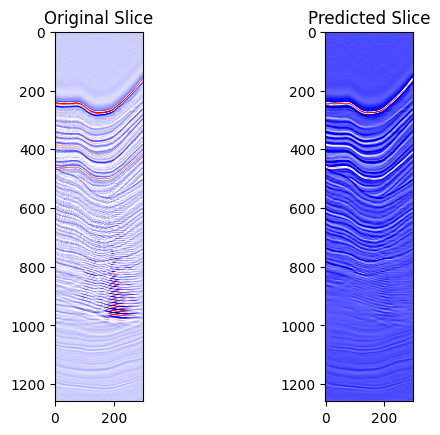

Epoch [5/200], Train Loss: 1402.9843, Train SSIM: 0.8623,           Val Loss: 1534.7440, Val SSIM: 0.8227


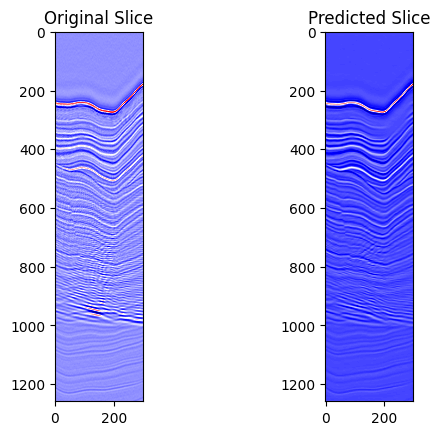

Epoch [6/200], Train Loss: 1374.5561, Train SSIM: 0.8696,           Val Loss: 1316.9104, Val SSIM: 0.8499


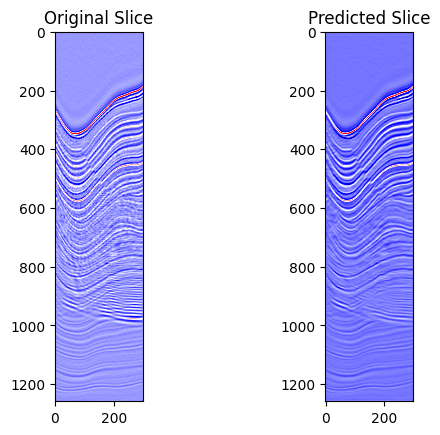

Epoch [7/200], Train Loss: 1333.9136, Train SSIM: 0.8776,           Val Loss: 1168.0000, Val SSIM: 0.8778


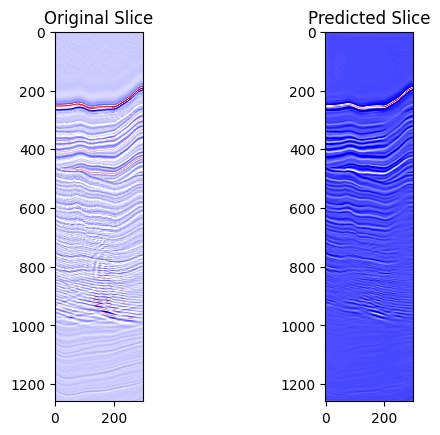

Epoch [8/200], Train Loss: 1300.7275, Train SSIM: 0.8858,           Val Loss: 1869.6299, Val SSIM: 0.7519


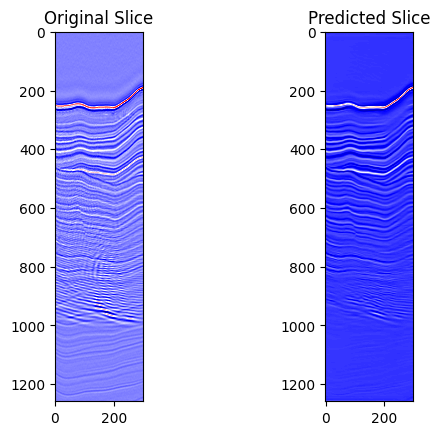

Epoch [9/200], Train Loss: 1275.0374, Train SSIM: 0.8929,           Val Loss: 2342.1940, Val SSIM: 0.7139


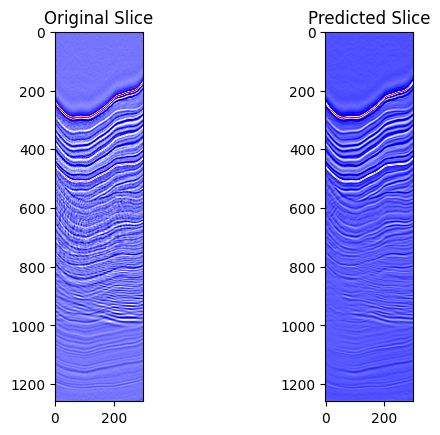

Epoch [10/200], Train Loss: 1276.2096, Train SSIM: 0.8943,           Val Loss: 1236.5255, Val SSIM: 0.8615


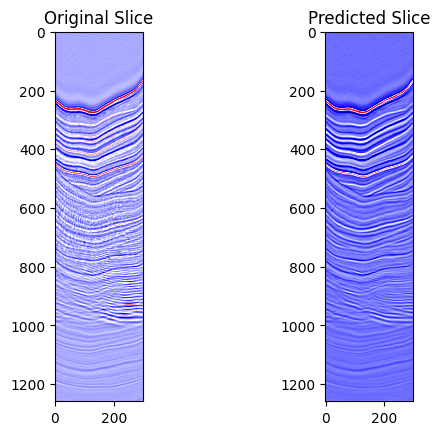

Epoch [11/200], Train Loss: 1252.8796, Train SSIM: 0.8998,           Val Loss: 1203.9845, Val SSIM: 0.8764


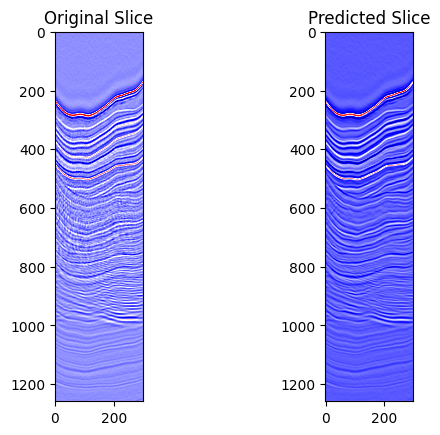

Epoch [12/200], Train Loss: 1248.4930, Train SSIM: 0.9014,           Val Loss: 1489.9164, Val SSIM: 0.8634


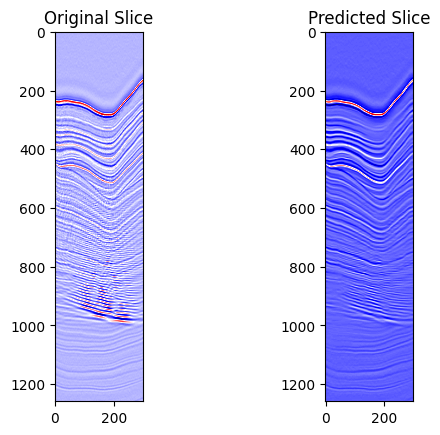

Epoch [13/200], Train Loss: 1237.3463, Train SSIM: 0.9049,           Val Loss: 1466.6837, Val SSIM: 0.8318


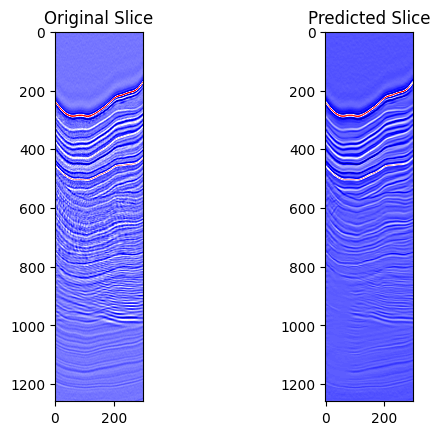

Epoch [14/200], Train Loss: 1235.6393, Train SSIM: 0.9063,           Val Loss: 1778.3209, Val SSIM: 0.8265


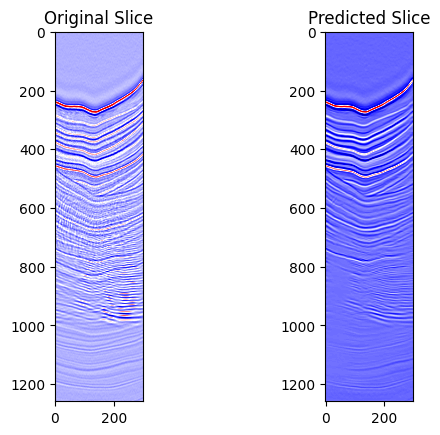

Epoch [15/200], Train Loss: 1231.1282, Train SSIM: 0.9078,           Val Loss: 1700.5030, Val SSIM: 0.8069


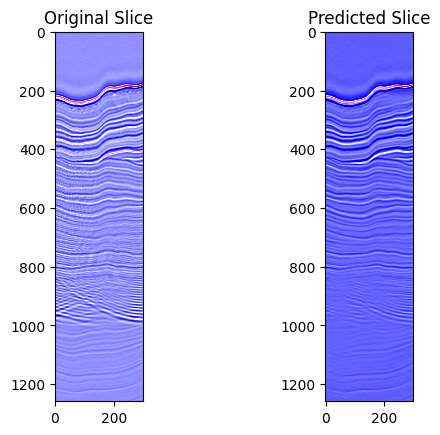

Epoch [16/200], Train Loss: 1222.2599, Train SSIM: 0.9089,           Val Loss: 1545.1037, Val SSIM: 0.7988


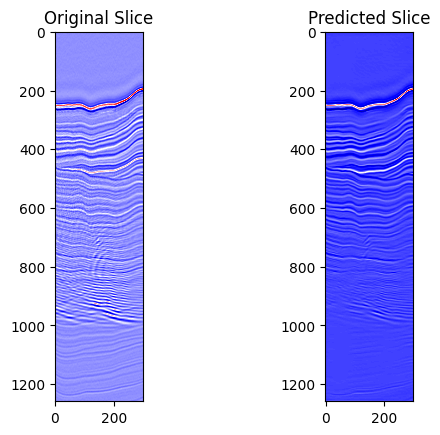

Epoch [17/200], Train Loss: 1227.4183, Train SSIM: 0.9090,           Val Loss: 1823.3084, Val SSIM: 0.7780


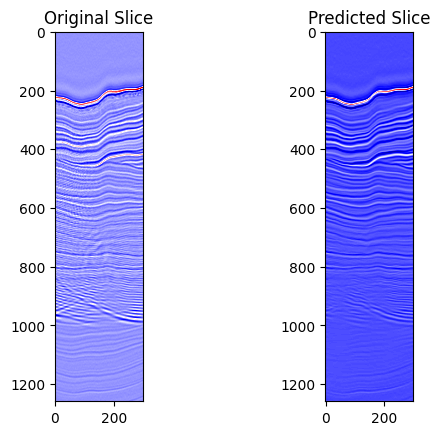

Epoch [18/200], Train Loss: 1218.2748, Train SSIM: 0.9116,           Val Loss: 1556.4684, Val SSIM: 0.8286


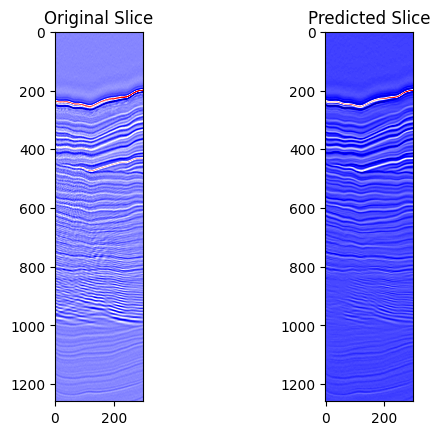

Epoch [19/200], Train Loss: 1213.4732, Train SSIM: 0.9129,           Val Loss: 1491.6301, Val SSIM: 0.8628


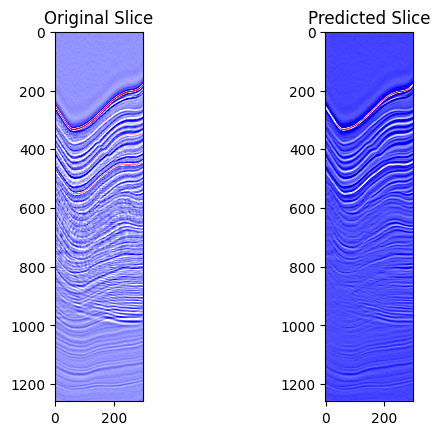

Epoch [20/200], Train Loss: 1210.7943, Train SSIM: 0.9139,           Val Loss: 1455.7014, Val SSIM: 0.8577


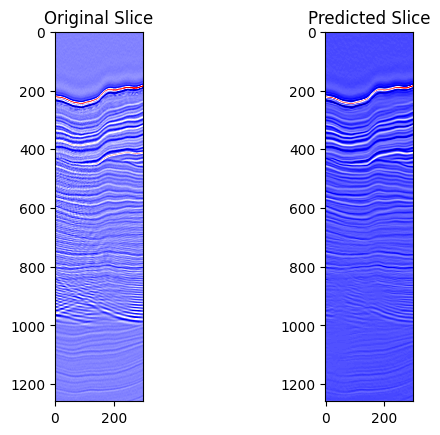

Epoch [21/200], Train Loss: 1211.7404, Train SSIM: 0.9146,           Val Loss: 1584.7009, Val SSIM: 0.8442


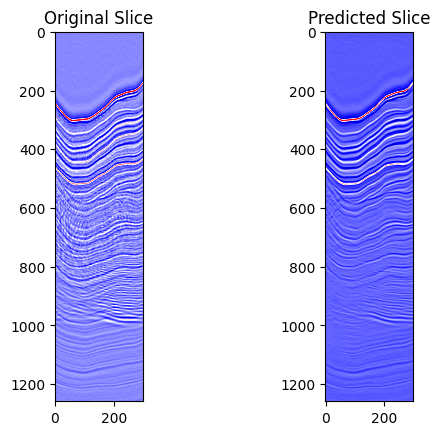

Epoch [22/200], Train Loss: 1211.8556, Train SSIM: 0.9138,           Val Loss: 1283.7376, Val SSIM: 0.8687


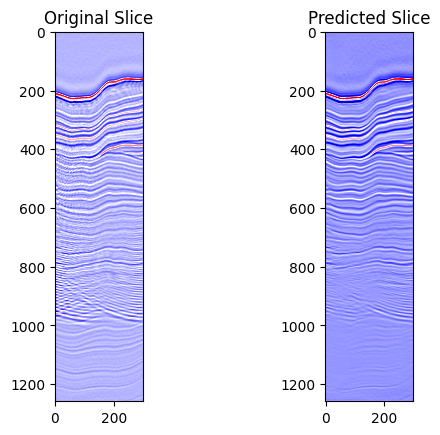

Epoch [23/200], Train Loss: 1207.3644, Train SSIM: 0.9146,           Val Loss: 1456.8042, Val SSIM: 0.8377


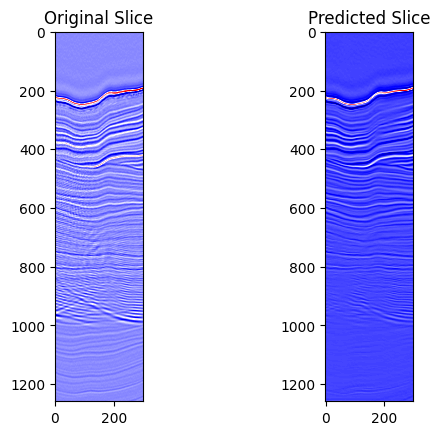

Epoch [24/200], Train Loss: 1204.1424, Train SSIM: 0.9156,           Val Loss: 1972.8346, Val SSIM: 0.7595


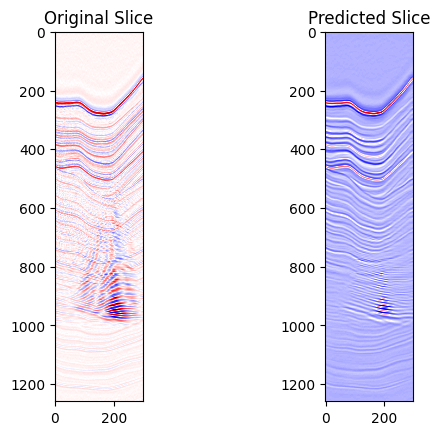

Epoch [25/200], Train Loss: 1205.4651, Train SSIM: 0.9156,           Val Loss: 1409.7058, Val SSIM: 0.8603


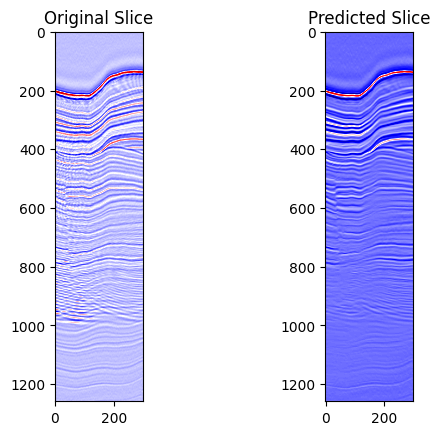

Epoch [26/200], Train Loss: 1210.8314, Train SSIM: 0.9146,           Val Loss: 1707.1033, Val SSIM: 0.8099


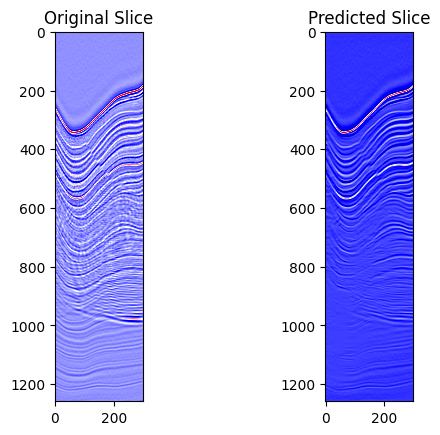

Epoch [27/200], Train Loss: 1198.8321, Train SSIM: 0.9174,           Val Loss: 1639.0966, Val SSIM: 0.8400


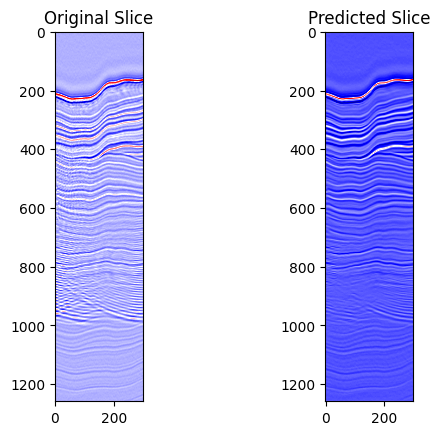

Epoch [28/200], Train Loss: 1198.0830, Train SSIM: 0.9172,           Val Loss: 1548.1311, Val SSIM: 0.8552


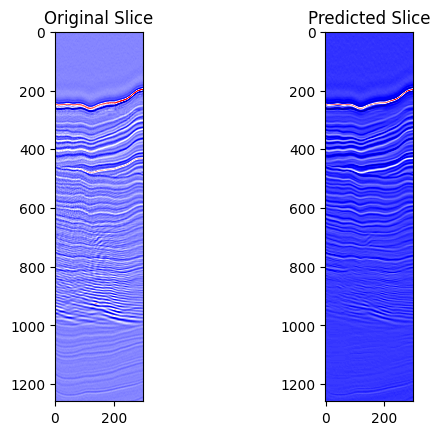

Epoch [29/200], Train Loss: 1197.6890, Train SSIM: 0.9178,           Val Loss: 1660.0547, Val SSIM: 0.8225


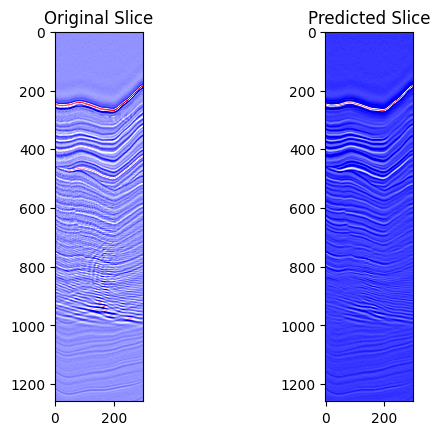

Epoch [30/200], Train Loss: 1199.8524, Train SSIM: 0.9171,           Val Loss: 1520.2639, Val SSIM: 0.8566


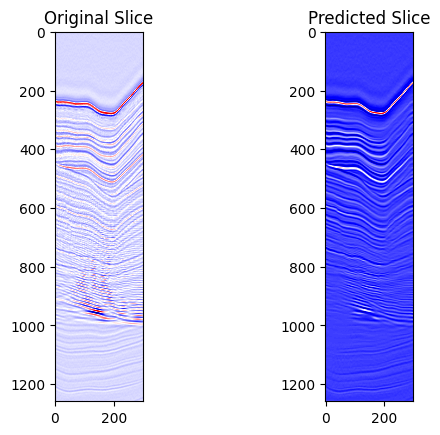

Epoch [31/200], Train Loss: 1200.4752, Train SSIM: 0.9170,           Val Loss: 1783.0821, Val SSIM: 0.8056


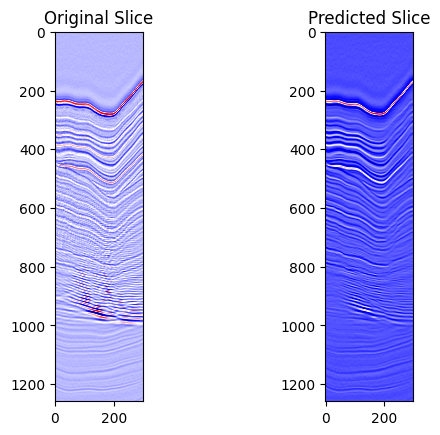

Epoch [32/200], Train Loss: 1194.6354, Train SSIM: 0.9187,           Val Loss: 1487.4606, Val SSIM: 0.8515


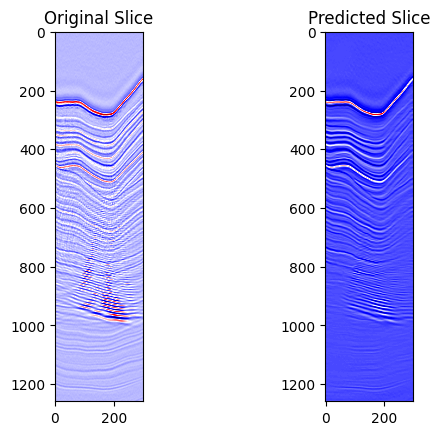

Epoch [33/200], Train Loss: 1193.6971, Train SSIM: 0.9184,           Val Loss: 1674.1449, Val SSIM: 0.8054


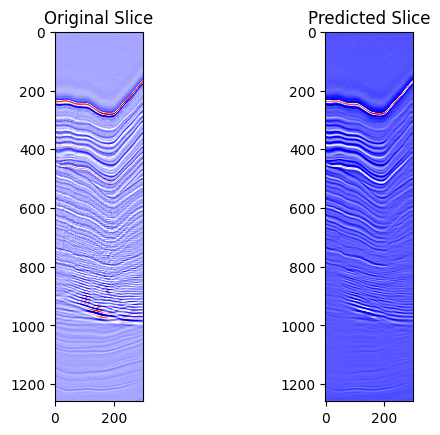

Epoch [34/200], Train Loss: 1194.8915, Train SSIM: 0.9189,           Val Loss: 1784.8949, Val SSIM: 0.7994


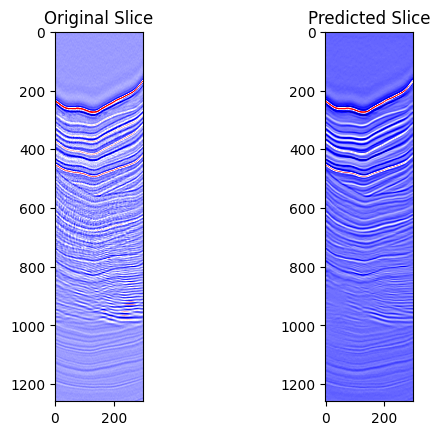

Epoch [35/200], Train Loss: 1191.7743, Train SSIM: 0.9191,           Val Loss: 1556.4919, Val SSIM: 0.8549


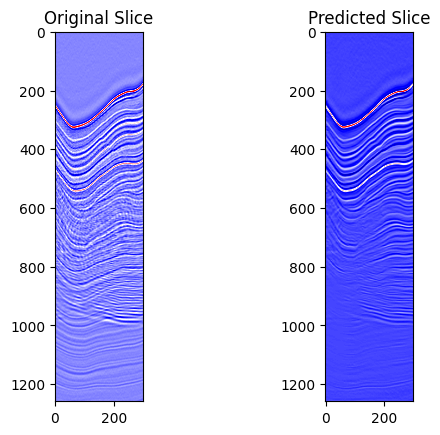

Epoch [36/200], Train Loss: 1192.1760, Train SSIM: 0.9194,           Val Loss: 1847.4776, Val SSIM: 0.7933


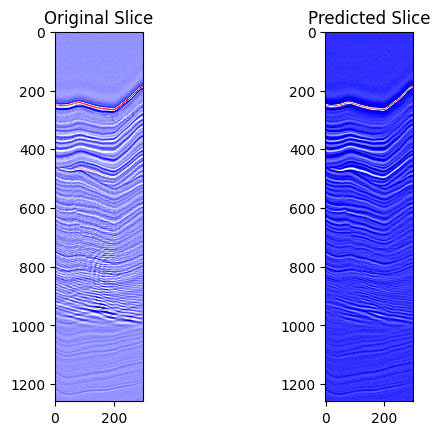

Epoch [37/200], Train Loss: 1193.7383, Train SSIM: 0.9190,           Val Loss: 1474.6141, Val SSIM: 0.8570


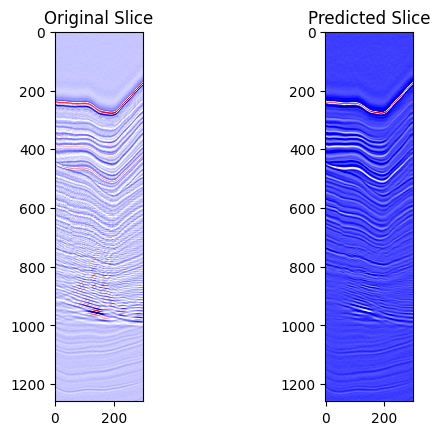

Epoch [38/200], Train Loss: 1191.7605, Train SSIM: 0.9194,           Val Loss: 1793.6297, Val SSIM: 0.8242


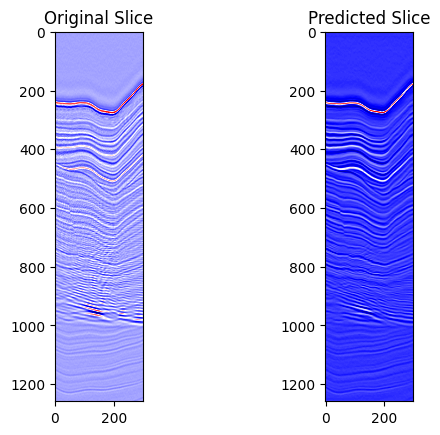

Epoch [39/200], Train Loss: 1187.8380, Train SSIM: 0.9202,           Val Loss: 1671.3629, Val SSIM: 0.8547


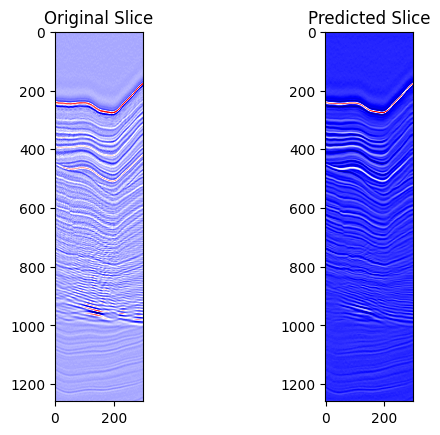

Epoch [40/200], Train Loss: 1186.5207, Train SSIM: 0.9202,           Val Loss: 1518.1845, Val SSIM: 0.8580


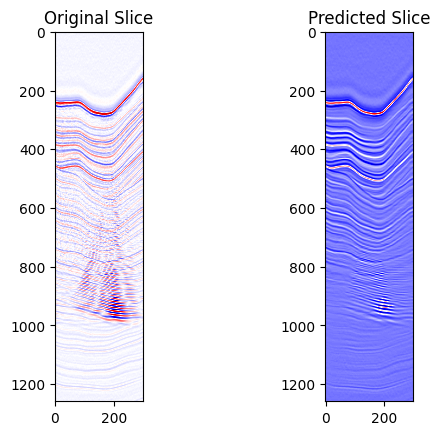

Epoch [41/200], Train Loss: 1188.6173, Train SSIM: 0.9203,           Val Loss: 2039.1568, Val SSIM: 0.7828


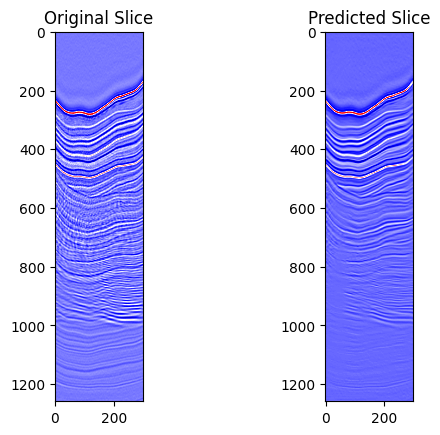

Epoch [42/200], Train Loss: 1192.3044, Train SSIM: 0.9194,           Val Loss: 1807.3017, Val SSIM: 0.7835


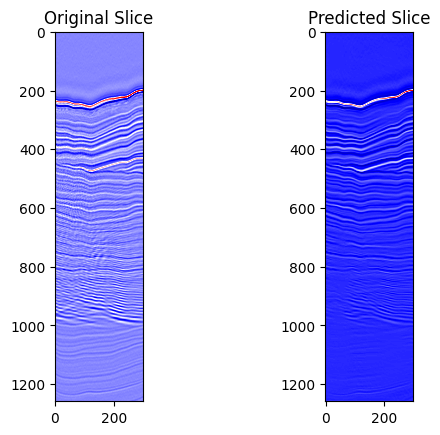

Epoch [43/200], Train Loss: 1190.2444, Train SSIM: 0.9197,           Val Loss: 1751.0277, Val SSIM: 0.7899


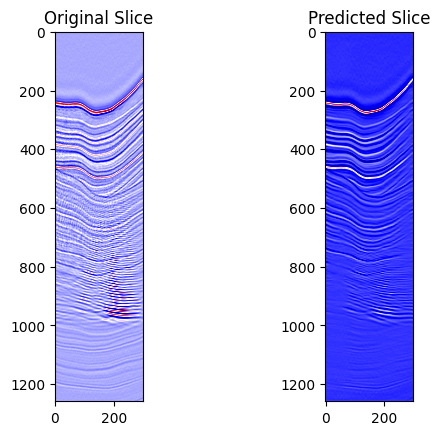

Epoch [44/200], Train Loss: 1189.1194, Train SSIM: 0.9201,           Val Loss: 1675.8427, Val SSIM: 0.8055


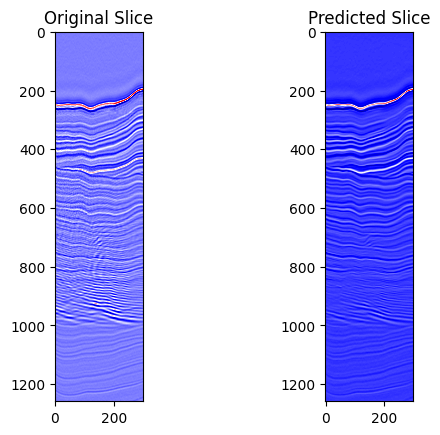

Epoch [45/200], Train Loss: 1187.7751, Train SSIM: 0.9207,           Val Loss: 1540.9826, Val SSIM: 0.8471


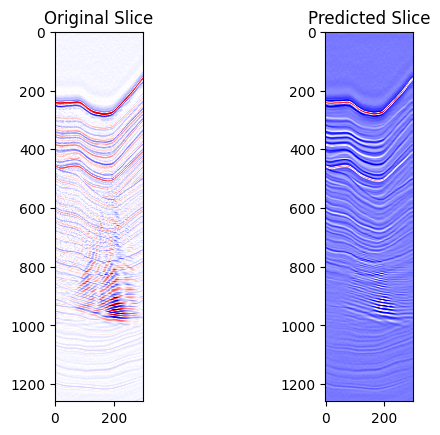

Epoch [46/200], Train Loss: 1187.1307, Train SSIM: 0.9201,           Val Loss: 1719.0012, Val SSIM: 0.8508


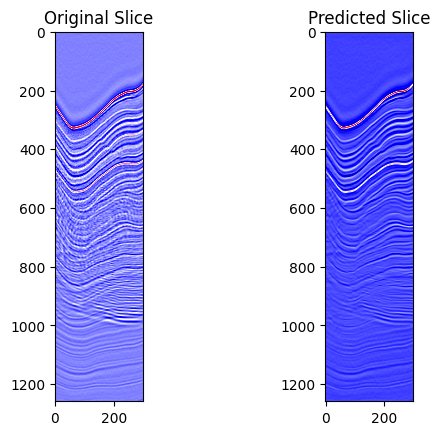

Epoch [47/200], Train Loss: 1185.6030, Train SSIM: 0.9208,           Val Loss: 1432.5686, Val SSIM: 0.8632


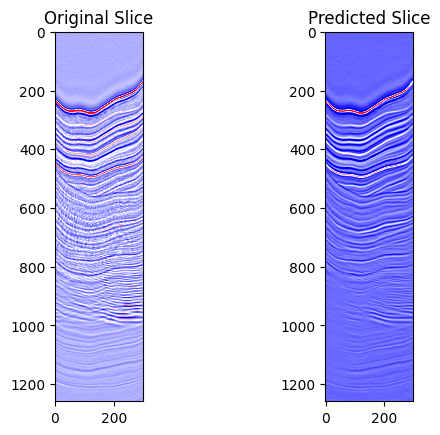

Epoch [48/200], Train Loss: 1183.0199, Train SSIM: 0.9214,           Val Loss: 1569.6328, Val SSIM: 0.8421


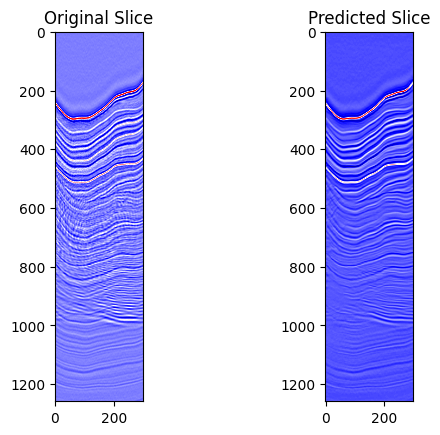

Epoch [49/200], Train Loss: 1182.4393, Train SSIM: 0.9213,           Val Loss: 1572.9512, Val SSIM: 0.8522


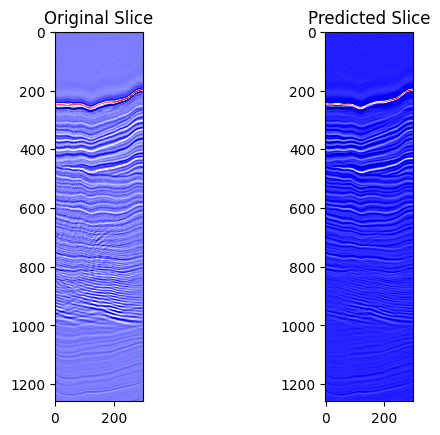

Epoch [50/200], Train Loss: 1183.1744, Train SSIM: 0.9214,           Val Loss: 1513.7128, Val SSIM: 0.8475


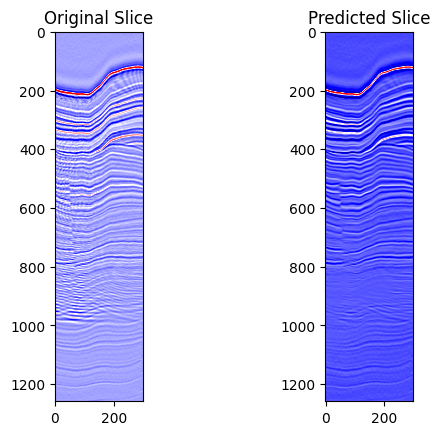

Epoch [51/200], Train Loss: 1183.2455, Train SSIM: 0.9216,           Val Loss: 1832.5401, Val SSIM: 0.8356


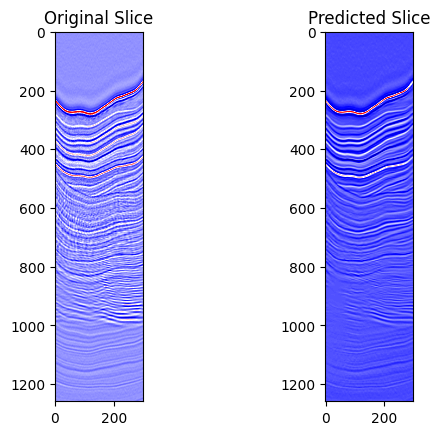

Epoch [52/200], Train Loss: 1181.9731, Train SSIM: 0.9215,           Val Loss: 1694.0092, Val SSIM: 0.8417


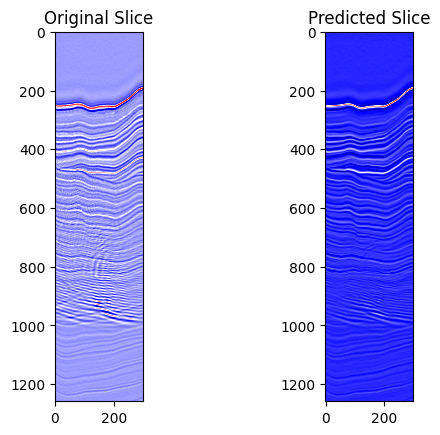

Epoch [53/200], Train Loss: 1187.1715, Train SSIM: 0.9201,           Val Loss: 1782.7113, Val SSIM: 0.8318


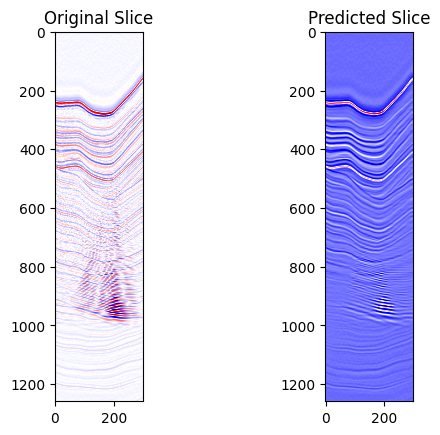

Epoch [54/200], Train Loss: 1181.5165, Train SSIM: 0.9212,           Val Loss: 1731.6595, Val SSIM: 0.8374


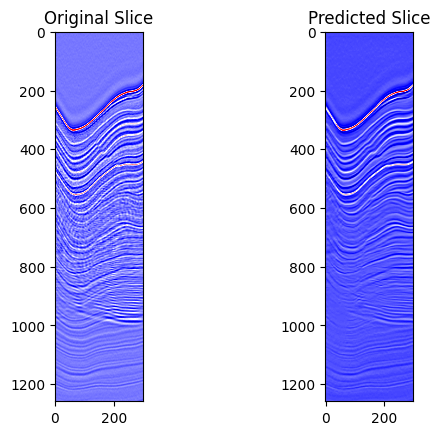

Epoch [55/200], Train Loss: 1180.0278, Train SSIM: 0.9222,           Val Loss: 1620.0832, Val SSIM: 0.8572


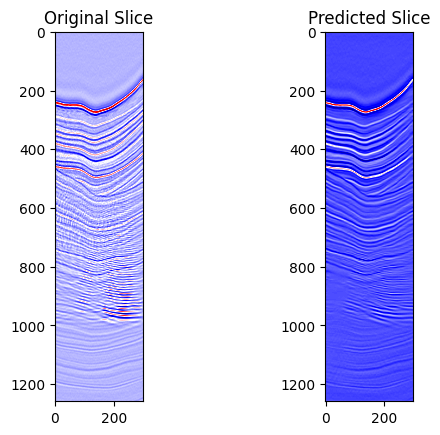

Epoch [56/200], Train Loss: 1179.4857, Train SSIM: 0.9224,           Val Loss: 1598.7678, Val SSIM: 0.8438


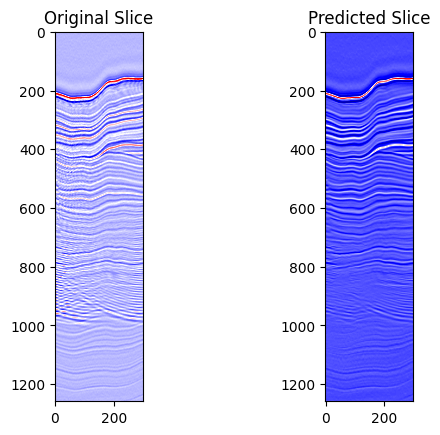

Epoch [57/200], Train Loss: 1180.8786, Train SSIM: 0.9219,           Val Loss: 1667.2342, Val SSIM: 0.8375


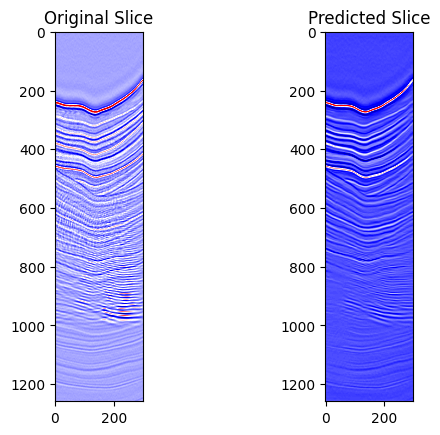

Epoch [58/200], Train Loss: 1181.6977, Train SSIM: 0.9222,           Val Loss: 1719.8096, Val SSIM: 0.8362


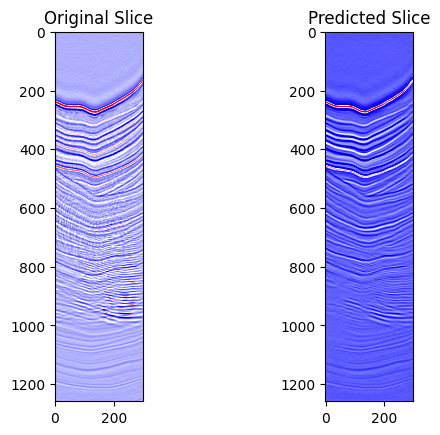

Epoch [59/200], Train Loss: 1182.6912, Train SSIM: 0.9215,           Val Loss: 1564.7819, Val SSIM: 0.8585


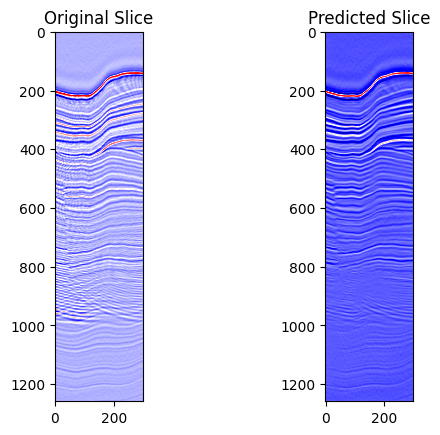

Epoch [60/200], Train Loss: 1182.5940, Train SSIM: 0.9214,           Val Loss: 1694.9360, Val SSIM: 0.8315


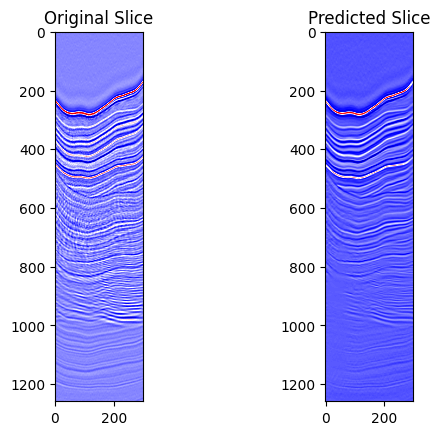

Epoch [61/200], Train Loss: 1181.1761, Train SSIM: 0.9220,           Val Loss: 1937.1442, Val SSIM: 0.8145


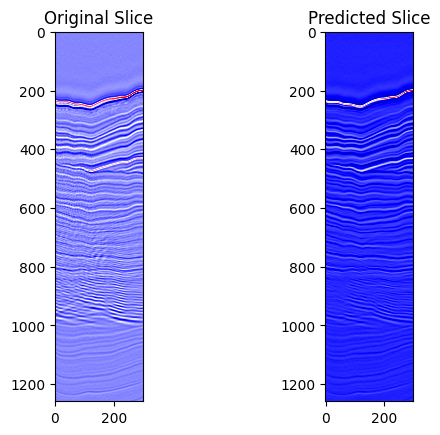

Epoch [62/200], Train Loss: 1178.1971, Train SSIM: 0.9226,           Val Loss: 1677.0301, Val SSIM: 0.8527


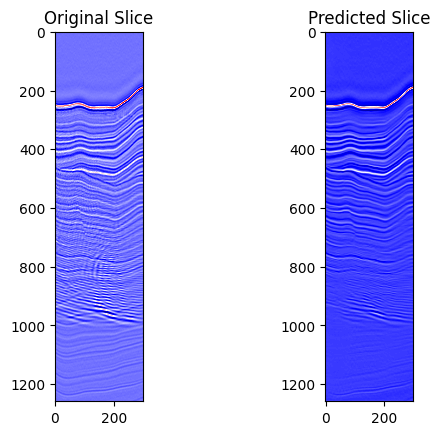

Epoch [63/200], Train Loss: 1178.9514, Train SSIM: 0.9220,           Val Loss: 1720.6270, Val SSIM: 0.8100


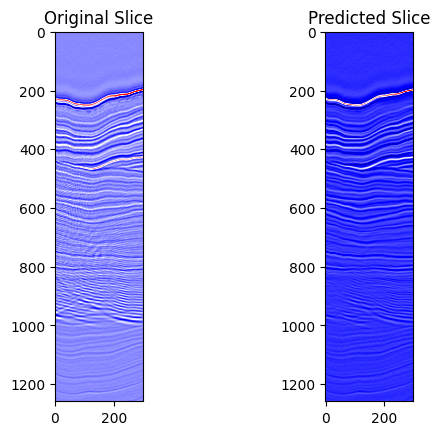

Epoch [64/200], Train Loss: 1180.0722, Train SSIM: 0.9217,           Val Loss: 1662.3331, Val SSIM: 0.8402


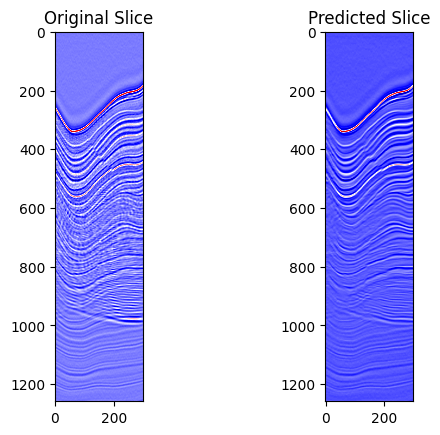

Epoch [65/200], Train Loss: 1182.3387, Train SSIM: 0.9218,           Val Loss: 1588.4347, Val SSIM: 0.8566


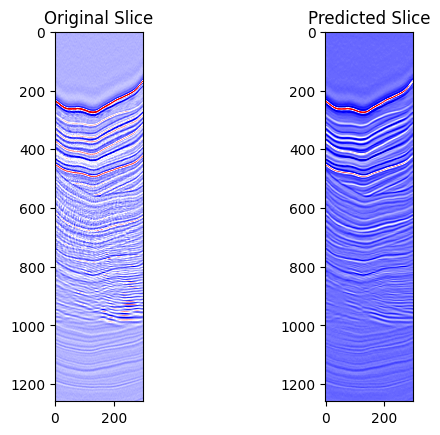

Epoch [66/200], Train Loss: 1178.4518, Train SSIM: 0.9222,           Val Loss: 1631.2800, Val SSIM: 0.8467


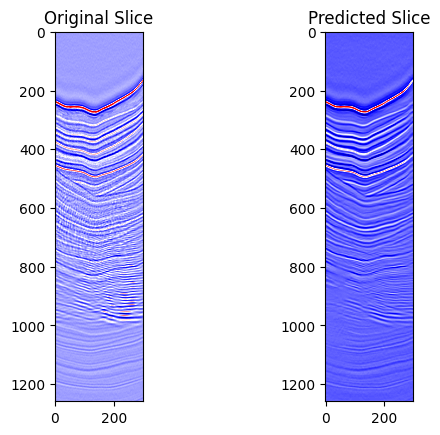

Epoch [67/200], Train Loss: 1178.5256, Train SSIM: 0.9226,           Val Loss: 1541.6692, Val SSIM: 0.8572


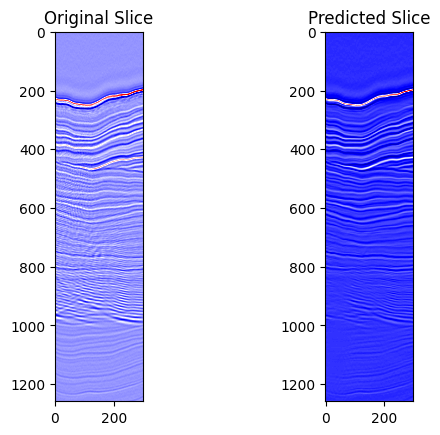

Epoch [68/200], Train Loss: 1176.6127, Train SSIM: 0.9228,           Val Loss: 1661.7205, Val SSIM: 0.8315


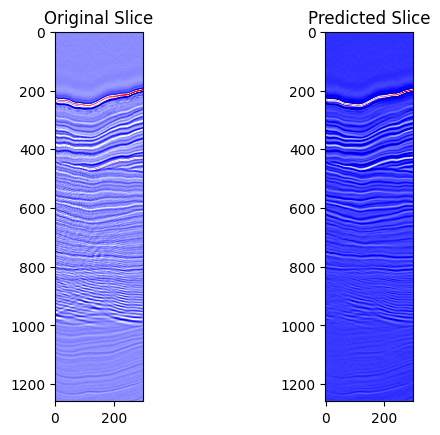

Epoch [69/200], Train Loss: 1176.4539, Train SSIM: 0.9226,           Val Loss: 1660.8348, Val SSIM: 0.8228


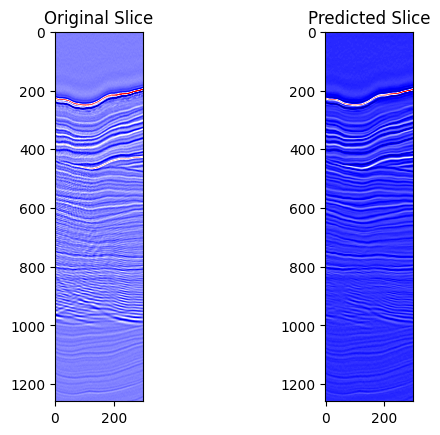

Epoch [70/200], Train Loss: 1178.1453, Train SSIM: 0.9214,           Val Loss: 1488.9859, Val SSIM: 0.8590


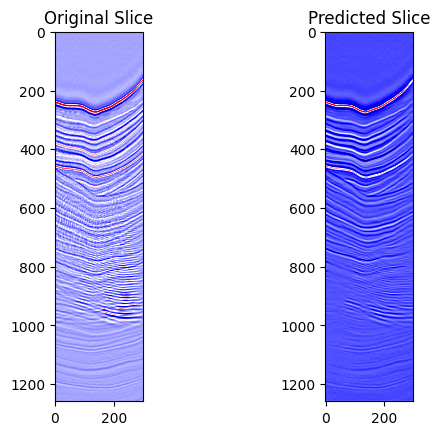

Epoch [71/200], Train Loss: 1177.8423, Train SSIM: 0.9221,           Val Loss: 1554.3488, Val SSIM: 0.8441


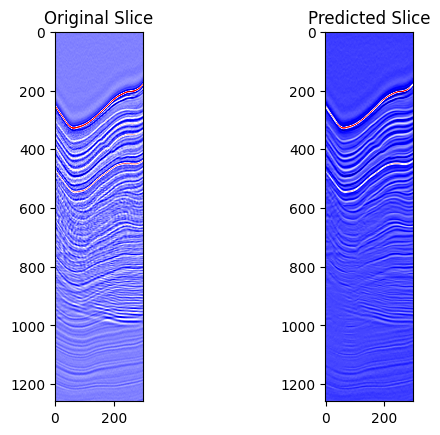

Epoch [72/200], Train Loss: 1176.2486, Train SSIM: 0.9230,           Val Loss: 1848.8729, Val SSIM: 0.8421


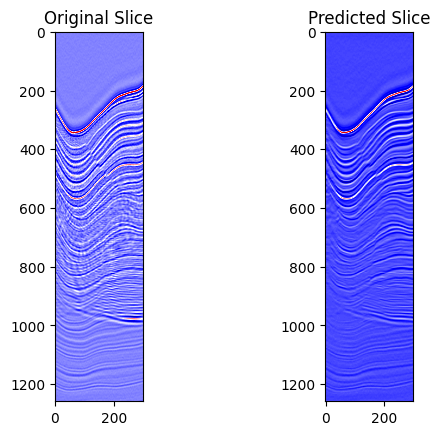

Epoch [73/200], Train Loss: 1176.5973, Train SSIM: 0.9227,           Val Loss: 1651.6654, Val SSIM: 0.8516


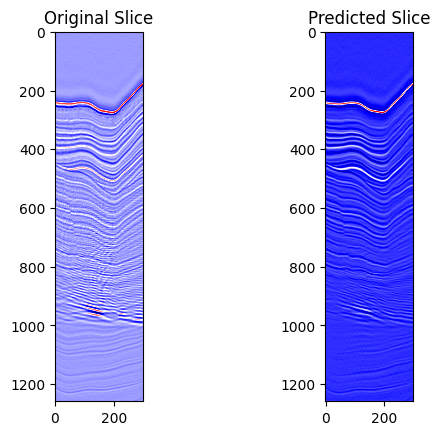

Epoch [74/200], Train Loss: 1175.3698, Train SSIM: 0.9228,           Val Loss: 1675.0935, Val SSIM: 0.8292


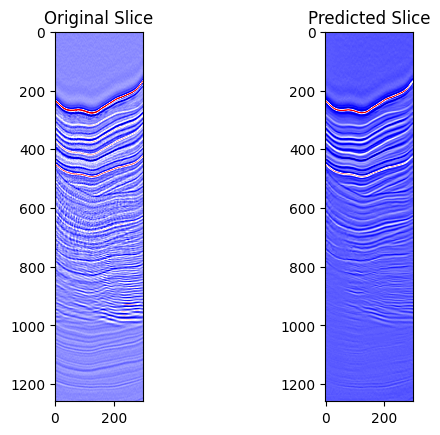

Epoch [75/200], Train Loss: 1179.7331, Train SSIM: 0.9222,           Val Loss: 2077.2108, Val SSIM: 0.7762


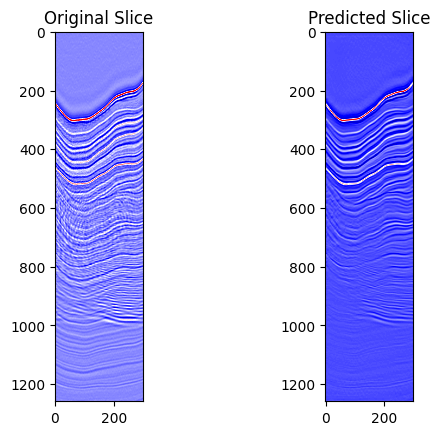

Epoch [76/200], Train Loss: 1178.3865, Train SSIM: 0.9220,           Val Loss: 1706.2771, Val SSIM: 0.8027


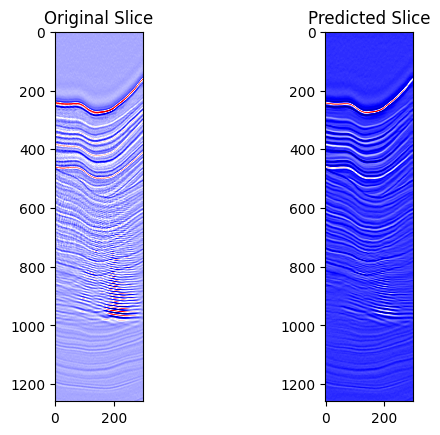

Epoch [77/200], Train Loss: 1174.6088, Train SSIM: 0.9229,           Val Loss: 1539.4673, Val SSIM: 0.8593


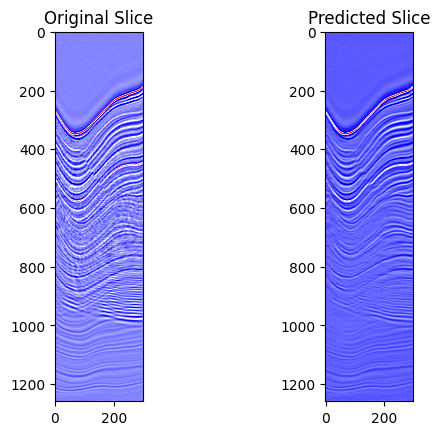

Epoch [78/200], Train Loss: 1175.2919, Train SSIM: 0.9230,           Val Loss: 1562.7146, Val SSIM: 0.8582


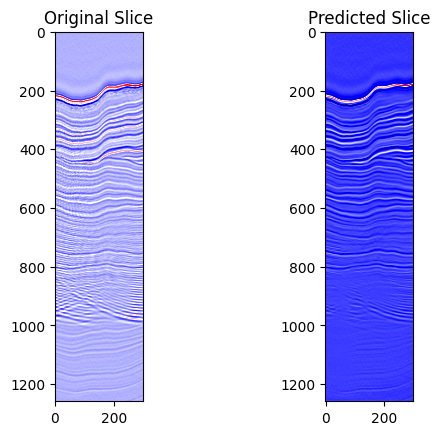

Epoch [79/200], Train Loss: 1178.1945, Train SSIM: 0.9225,           Val Loss: 1847.2504, Val SSIM: 0.8155


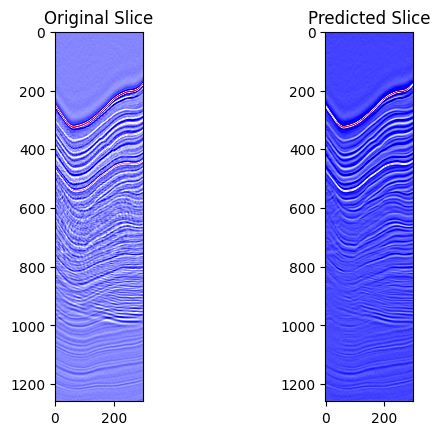

Epoch [80/200], Train Loss: 1177.9802, Train SSIM: 0.9228,           Val Loss: 1503.0349, Val SSIM: 0.8585


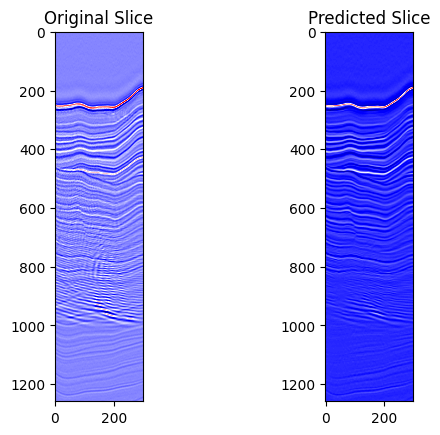

Epoch [81/200], Train Loss: 1177.4240, Train SSIM: 0.9222,           Val Loss: 1829.4940, Val SSIM: 0.8102


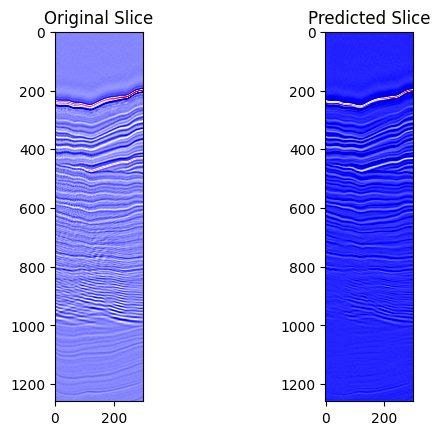

Epoch [82/200], Train Loss: 1177.8629, Train SSIM: 0.9229,           Val Loss: 1796.8322, Val SSIM: 0.7989


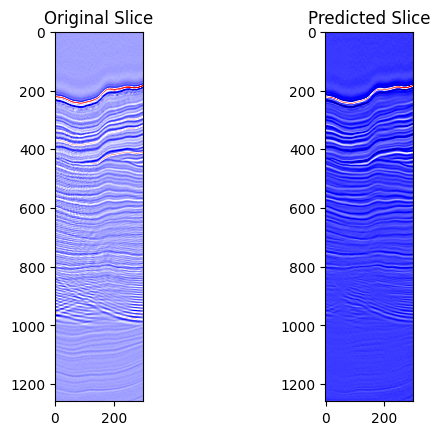

Epoch [83/200], Train Loss: 1175.9897, Train SSIM: 0.9226,           Val Loss: 1805.8776, Val SSIM: 0.7996


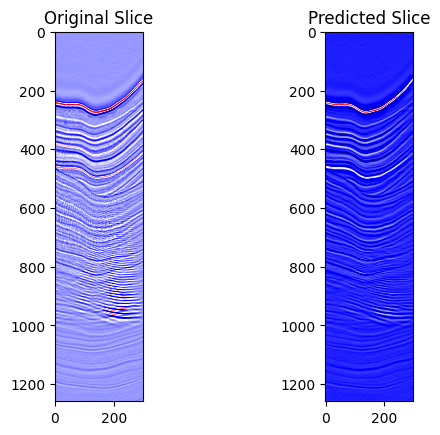

Epoch [84/200], Train Loss: 1178.8235, Train SSIM: 0.9227,           Val Loss: 1510.2296, Val SSIM: 0.8497


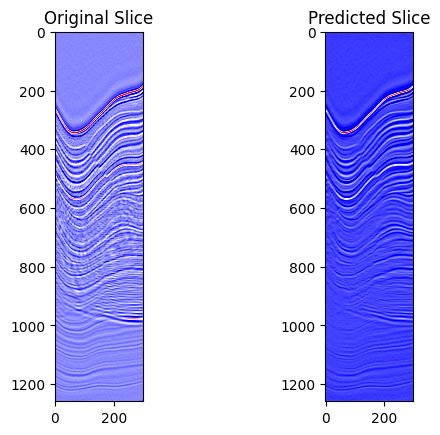

Epoch [85/200], Train Loss: 1175.3949, Train SSIM: 0.9233,           Val Loss: 1496.9439, Val SSIM: 0.8625


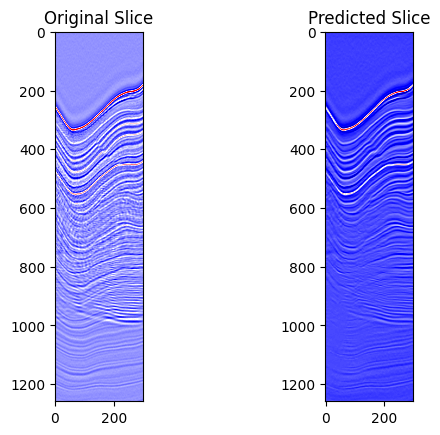

Epoch [86/200], Train Loss: 1174.7398, Train SSIM: 0.9233,           Val Loss: 1769.7086, Val SSIM: 0.8403


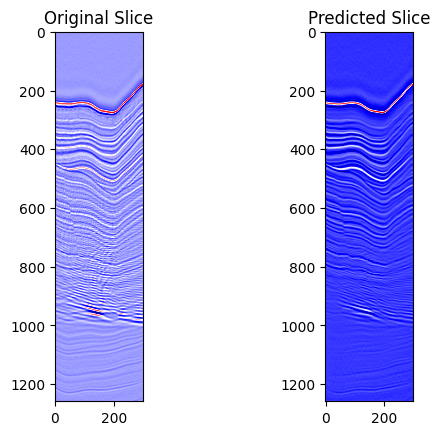

Epoch [87/200], Train Loss: 1175.1381, Train SSIM: 0.9230,           Val Loss: 1558.8188, Val SSIM: 0.8290


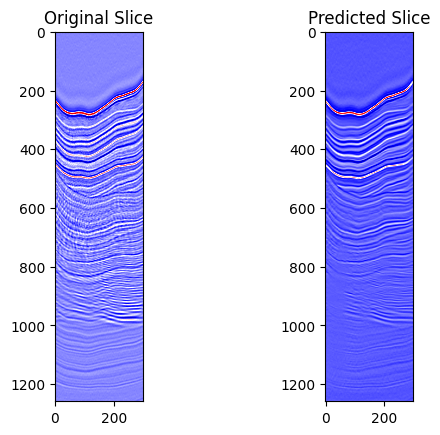

Epoch [88/200], Train Loss: 1176.0878, Train SSIM: 0.9227,           Val Loss: 1632.7205, Val SSIM: 0.8314


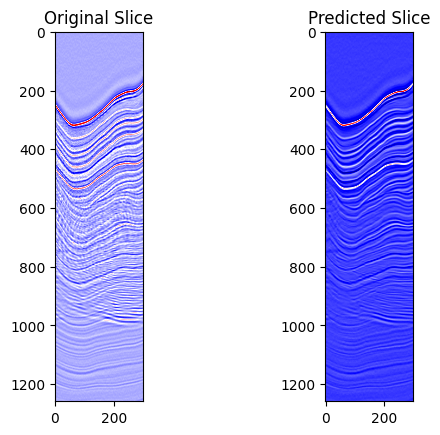

Epoch [89/200], Train Loss: 1175.6204, Train SSIM: 0.9230,           Val Loss: 1667.9699, Val SSIM: 0.8549


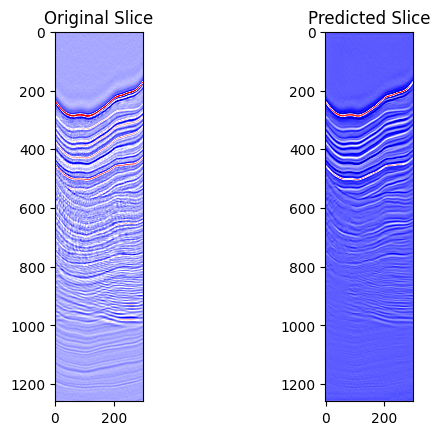

Epoch [90/200], Train Loss: 1174.6005, Train SSIM: 0.9229,           Val Loss: 1852.8128, Val SSIM: 0.7850


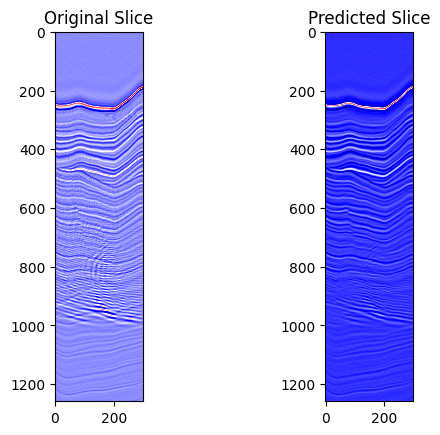

Epoch [91/200], Train Loss: 1173.6766, Train SSIM: 0.9238,           Val Loss: 1452.3107, Val SSIM: 0.8589


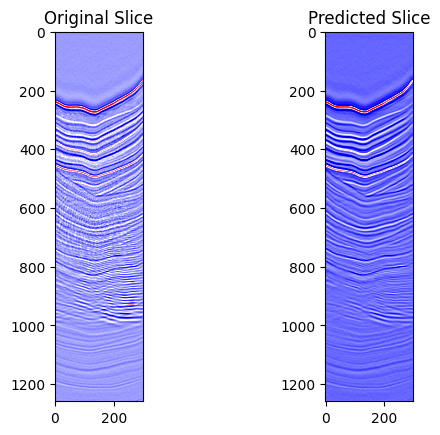

Epoch [92/200], Train Loss: 1173.5157, Train SSIM: 0.9234,           Val Loss: 1484.6429, Val SSIM: 0.8614


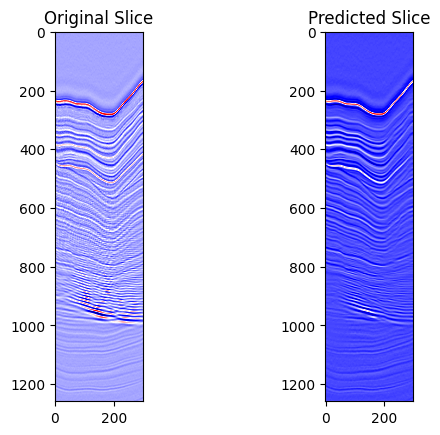

Epoch [93/200], Train Loss: 1173.3812, Train SSIM: 0.9239,           Val Loss: 1591.5051, Val SSIM: 0.8407


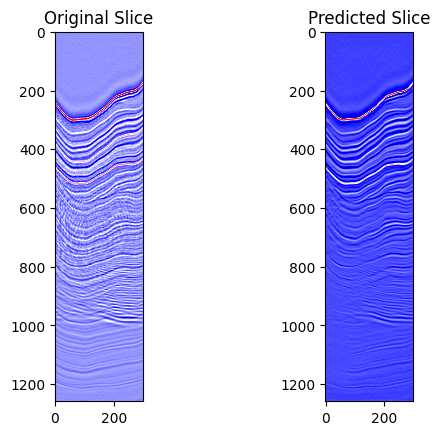

Epoch [94/200], Train Loss: 1174.6194, Train SSIM: 0.9234,           Val Loss: 1491.3676, Val SSIM: 0.8473


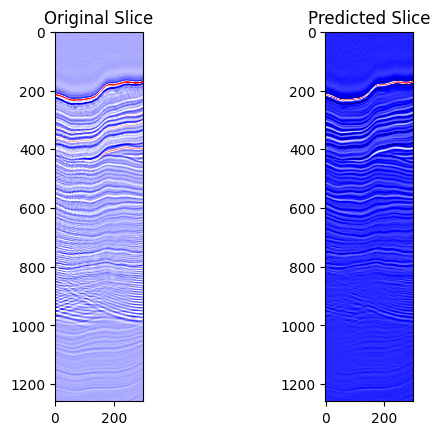

Epoch [95/200], Train Loss: 1174.6847, Train SSIM: 0.9234,           Val Loss: 1583.4792, Val SSIM: 0.8262


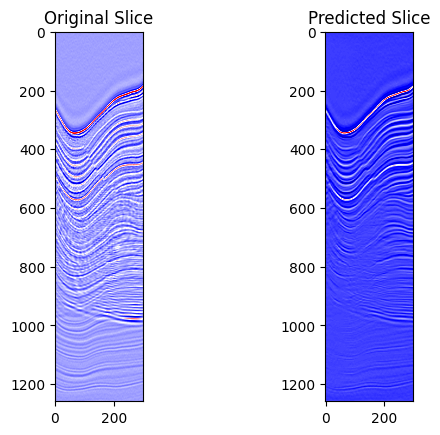

Epoch [96/200], Train Loss: 1175.3122, Train SSIM: 0.9230,           Val Loss: 1824.3796, Val SSIM: 0.8163


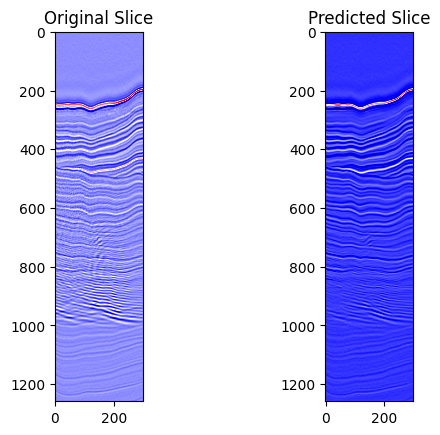

Epoch [97/200], Train Loss: 1175.0866, Train SSIM: 0.9235,           Val Loss: 1597.2799, Val SSIM: 0.8572


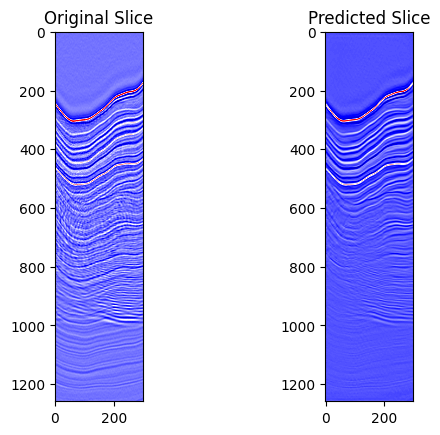

Epoch [98/200], Train Loss: 1173.5937, Train SSIM: 0.9238,           Val Loss: 1776.0180, Val SSIM: 0.7956


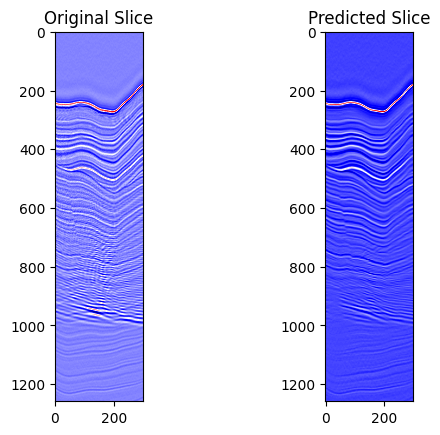

Epoch [99/200], Train Loss: 1175.5462, Train SSIM: 0.9233,           Val Loss: 1681.3661, Val SSIM: 0.8261


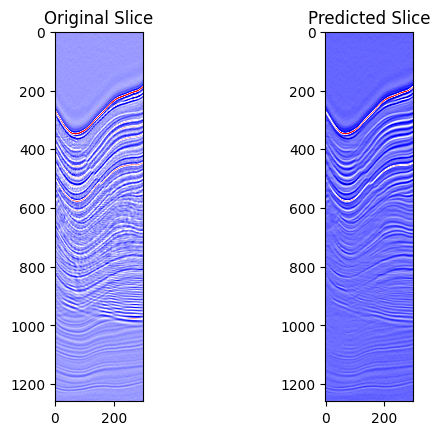

Epoch [100/200], Train Loss: 1174.6200, Train SSIM: 0.9235,           Val Loss: 1525.6578, Val SSIM: 0.8568


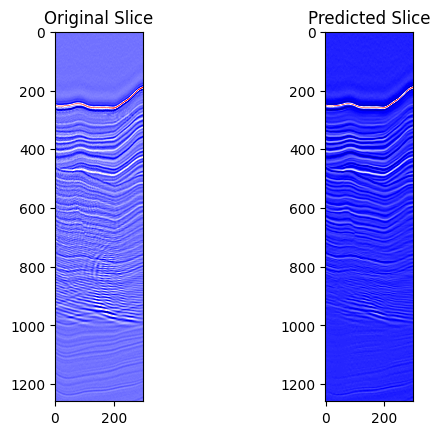

Epoch [101/200], Train Loss: 1173.8786, Train SSIM: 0.9236,           Val Loss: 1775.7378, Val SSIM: 0.8123


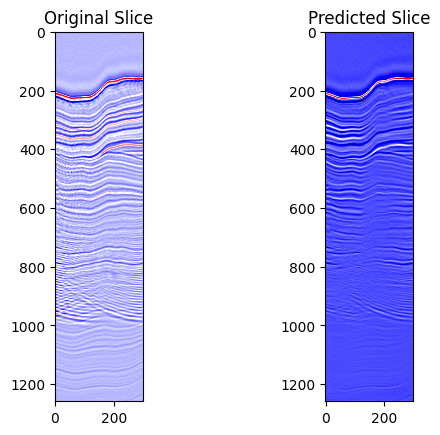

Epoch [102/200], Train Loss: 1174.8345, Train SSIM: 0.9239,           Val Loss: 1640.8725, Val SSIM: 0.8081


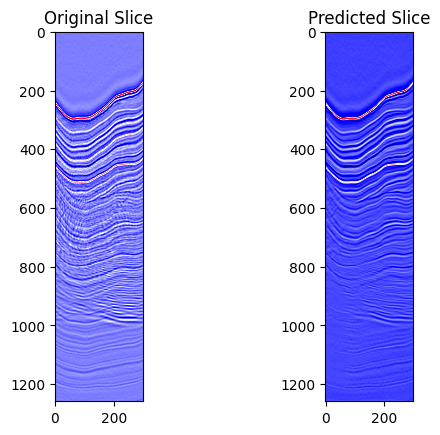

Epoch [103/200], Train Loss: 1174.3850, Train SSIM: 0.9235,           Val Loss: 1579.7544, Val SSIM: 0.8446


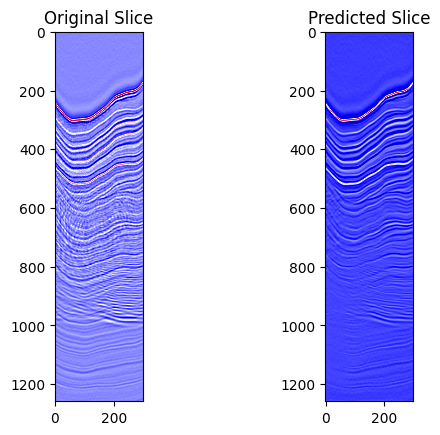

Epoch [104/200], Train Loss: 1172.5457, Train SSIM: 0.9239,           Val Loss: 1601.1153, Val SSIM: 0.8423


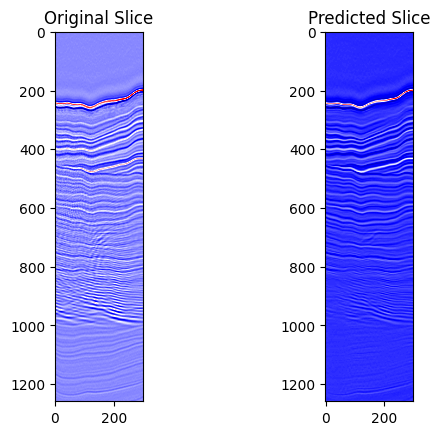

Epoch [105/200], Train Loss: 1174.3070, Train SSIM: 0.9237,           Val Loss: 1737.0007, Val SSIM: 0.8073


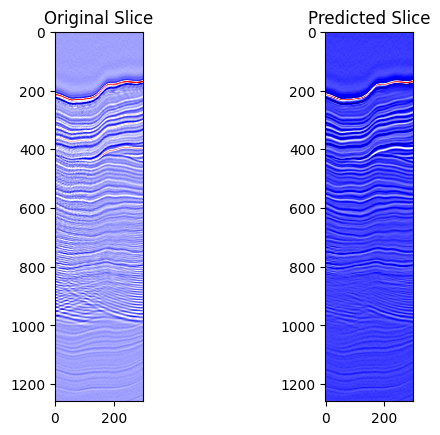

Epoch [106/200], Train Loss: 1174.1145, Train SSIM: 0.9233,           Val Loss: 1488.0586, Val SSIM: 0.8570


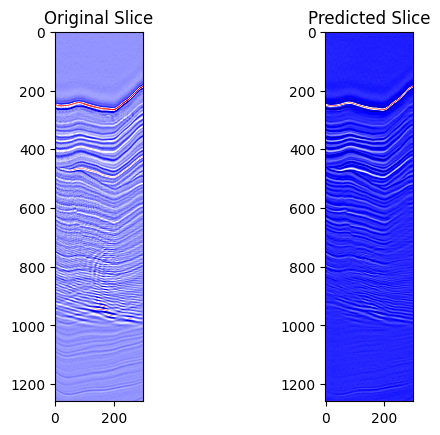

Epoch [107/200], Train Loss: 1173.0188, Train SSIM: 0.9240,           Val Loss: 1787.2045, Val SSIM: 0.8037


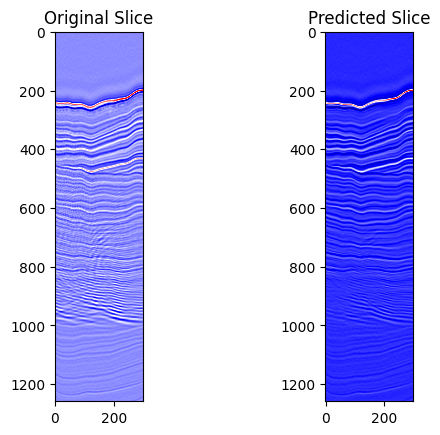

Epoch [108/200], Train Loss: 1171.0183, Train SSIM: 0.9242,           Val Loss: 1516.3491, Val SSIM: 0.8605


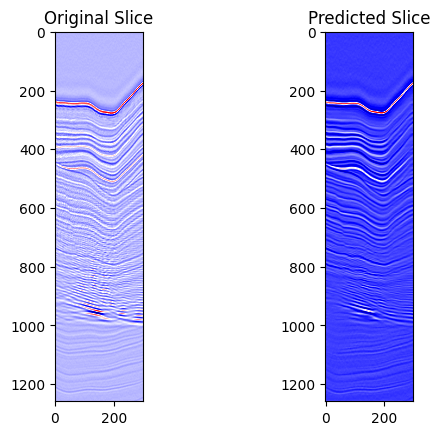

Epoch [109/200], Train Loss: 1172.6209, Train SSIM: 0.9238,           Val Loss: 1536.5397, Val SSIM: 0.8509


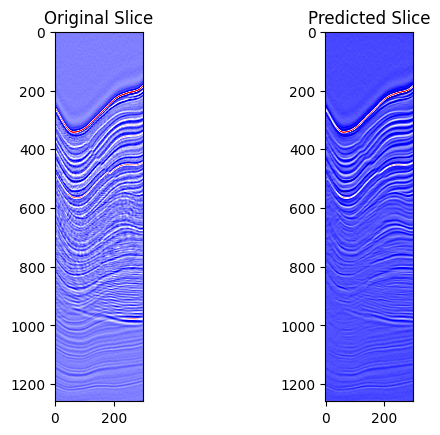

Epoch [110/200], Train Loss: 1174.6714, Train SSIM: 0.9236,           Val Loss: 1496.5756, Val SSIM: 0.8582


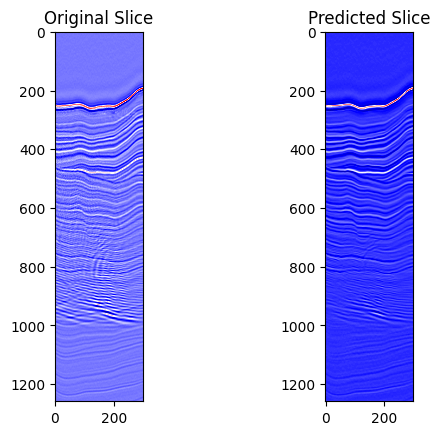

Epoch [111/200], Train Loss: 1172.8812, Train SSIM: 0.9241,           Val Loss: 1473.1343, Val SSIM: 0.8591


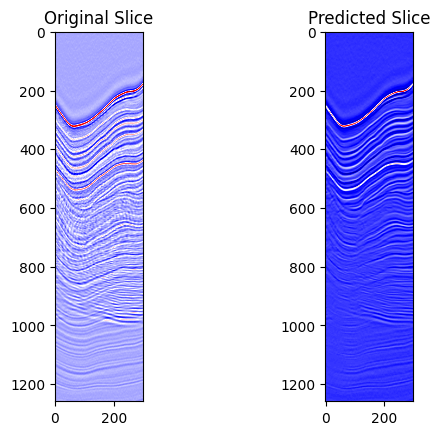

Epoch [112/200], Train Loss: 1174.8899, Train SSIM: 0.9237,           Val Loss: 1635.4235, Val SSIM: 0.8381


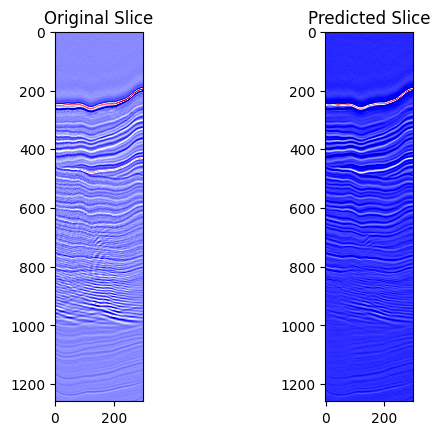

Epoch [113/200], Train Loss: 1174.0454, Train SSIM: 0.9235,           Val Loss: 1659.8845, Val SSIM: 0.8381


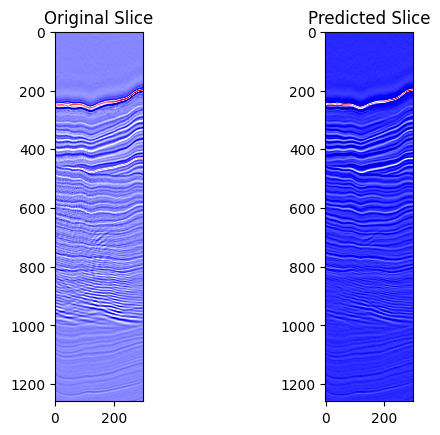

Epoch [114/200], Train Loss: 1174.7505, Train SSIM: 0.9237,           Val Loss: 1535.0659, Val SSIM: 0.8606


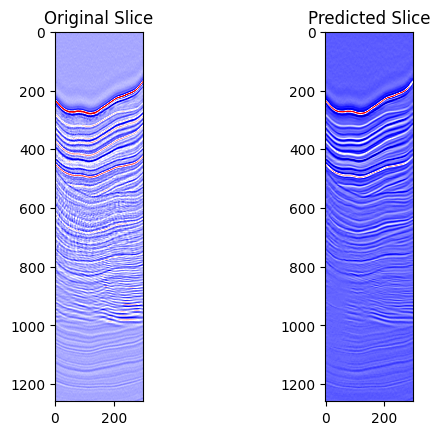

Epoch [115/200], Train Loss: 1172.8126, Train SSIM: 0.9236,           Val Loss: 1584.5210, Val SSIM: 0.8475


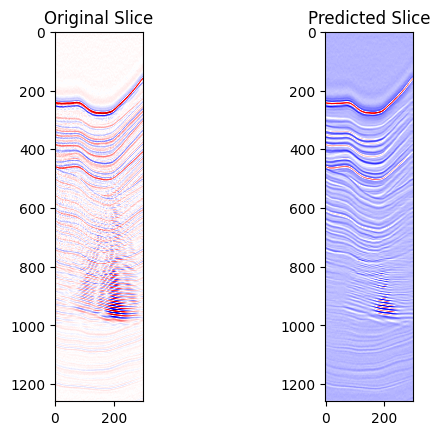

Epoch [116/200], Train Loss: 1171.7348, Train SSIM: 0.9240,           Val Loss: 1608.1457, Val SSIM: 0.8494


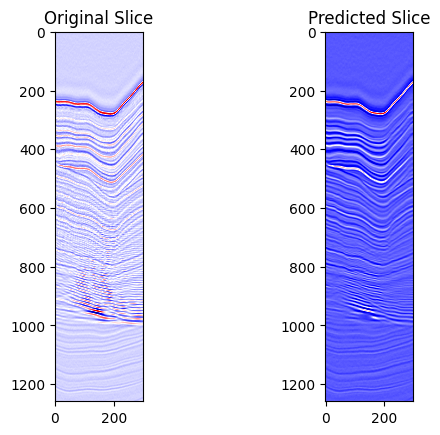

Epoch [117/200], Train Loss: 1173.6368, Train SSIM: 0.9236,           Val Loss: 1547.2677, Val SSIM: 0.8578


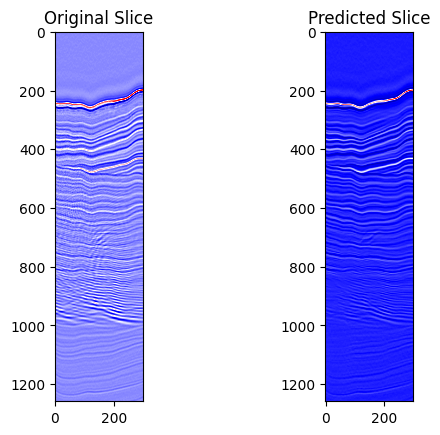

Epoch [118/200], Train Loss: 1174.3121, Train SSIM: 0.9235,           Val Loss: 1589.4003, Val SSIM: 0.8427


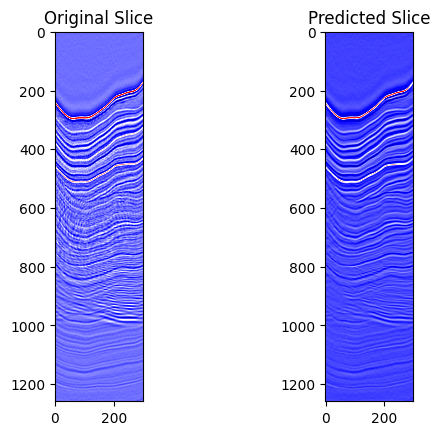

Epoch [119/200], Train Loss: 1172.6978, Train SSIM: 0.9244,           Val Loss: 1545.8168, Val SSIM: 0.8547


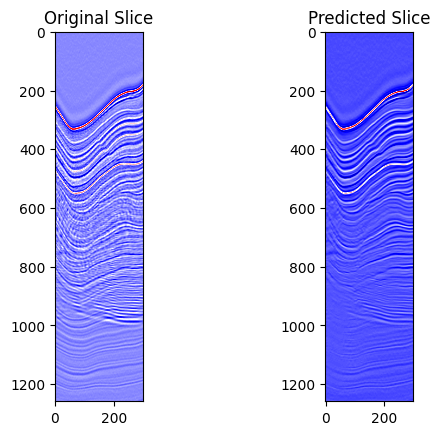

Epoch [120/200], Train Loss: 1171.0722, Train SSIM: 0.9243,           Val Loss: 1500.4455, Val SSIM: 0.8553


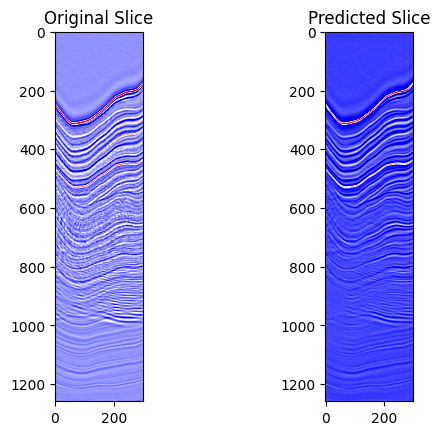

Epoch [121/200], Train Loss: 1170.8711, Train SSIM: 0.9243,           Val Loss: 1486.7113, Val SSIM: 0.8616


In [ ]:
# Number of epochs
num_epochs = 200

# Training loop
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    running_ssim = 0.0

    for x_batch, y_batch in train_loader:
        optimizer.zero_grad()
        outputs = model(x_batch)
        loss = criterion(outputs, y_batch)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()
        batch_ssim = ssim_metric(outputs.detach(), y_batch.detach())
        running_ssim += batch_ssim.item()

    # Validation phase
    model.eval()
    val_loss = 0.0
    val_ssim = 0.0
    with torch.no_grad():
        for x_val, y_val in val_loader:
            val_outputs = model(x_val)
            val_loss += criterion(val_outputs, y_val).item()
            val_ssim += ssim_metric(val_outputs, y_val).item()

    # Prediction on a single slice from X_slices_t
    random_slice = X_slices_t[torch.randint(0, len(X_slices_t), (1,)).item()]

    # Convert to PyTorch tensor and add batch and channel dimensions
    random_slice = torch.tensor(random_slice, dtype=torch.float32).unsqueeze(0).unsqueeze(0)

    prediction = model(random_slice).detach()

    # Visualize the original and predicted slice
    plt.subplot(1, 2, 1)
    plt.title("Original Slice")
    plt.imshow(random_slice.squeeze().cpu().numpy(), cmap='seismic')

    plt.subplot(1, 2, 2)
    plt.title("Predicted Slice")
    plt.imshow(prediction.squeeze().cpu().numpy(), cmap='seismic')
    plt.show()

    print(f"Epoch [{epoch + 1}/{num_epochs}], Train Loss: {running_loss / len(train_loader):.4f}, Train SSIM: {running_ssim / len(train_loader):.4f}, \
          Val Loss: {val_loss / len(val_loader):.4f}, Val SSIM: {val_ssim / len(val_loader):.4f}")


print("Training complete!")
